In [1]:
using Catalyst, DifferentialEquations, Plots, Latexify

# MUTUAL REPRESSOR

In [89]:
kepler = @reaction_network begin
    
    δ, M1 --> ∅
    δ, M2 --> ∅
    
    α1*O1, ∅ --> M1
    α2*O2, ∅ --> M2
    
    (Θ*a), D1 --> M1 + M1
    a, M1 + M1 --> D1
    
    (Θ*a), D2 --> M2 + M2
    a, M2 + M2 --> D2   
    
    K, O0 + D1 --> O1
    (β*K), O1 --> O0 + D1
    
    K, O0 + D2 --> O2
    (β*K), O2 --> O0 + D2
    
end δ α1 α2  Θ a K β

Model ##ReactionSystem#304 with 12 equations
States (7):
  M1(t)
  M2(t)
  D1(t)
  D2(t)
  O0(t)
  O1(t)
⋮
Parameters (7):
  δ
  α1
  α2
  Θ
  a
  K
⋮

In [90]:
odesys = convert(ODESystem, kepler)

Model ##ReactionSystem#304 with 7 equations
States (7):
  M1(t)
  M2(t)
  D1(t)
  D2(t)
  O0(t)
  O1(t)
⋮
Parameters (7):
  δ
  α1
  α2
  Θ
  a
  K
⋮

In [91]:
speciesmap(kepler)

Dict{Term{Real, Base.ImmutableDict{DataType, Any}}, Int64} with 7 entries:
  O2(t) => 7
  D1(t) => 3
  O0(t) => 5
  O1(t) => 6
  D2(t) => 4
  M1(t) => 1
  M2(t) => 2

In [92]:
paramsmap(kepler)

Dict{Sym{Real, Base.ImmutableDict{DataType, Any}}, Int64} with 7 entries:
  K  => 6
  Θ  => 4
  δ  => 1
  α2 => 3
  α1 => 2
  a  => 5
  β  => 7

In [101]:
p = (0.9, 1.5, 1.5, log(2)/120, 5e-3, 20*log(2)/120, log(2)/60)

u₀ = [20.,30.,0, 0, 1., 0., 0.]

tspan = (0., 10000.)

oprob = ODEProblem(kepler, u₀, tspan, p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10000.0)
u0: 7-element Vector{Float64}:
 20.0
 30.0
  0.0
  0.0
  1.0
  0.0
  0.0

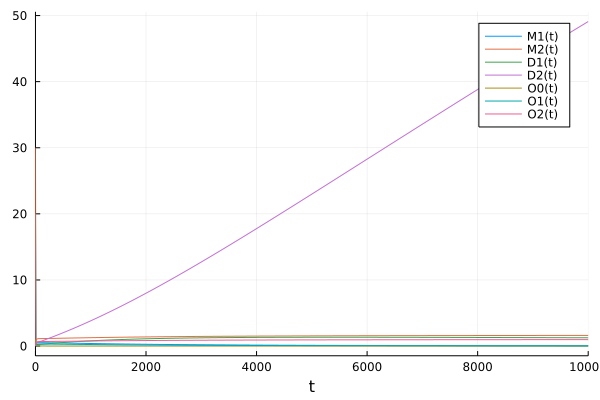

In [102]:
sol = solve(oprob, Tsit5(), saveat=10.)
plot(sol)

In [103]:
dprob = DiscreteProblem(kepler, u₀ , tspan , p)
jprob = JumpProblem(kepler, dprob, Direct(), save_positions = (false,false))

sol2 = solve(jprob , SSAStepper(), saveat=10.)
plot(sol2)